<a href="https://colab.research.google.com/github/qbgbduenas-ship-it/CPE-018-CPE31S2/blob/main/Activity_6_Face_Detection_using_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
1st Semester | AY 2023-2024
<hr> | <hr>
<u>**ACTIVITY NO.** | **TITLE**
**Name** | Duenas, Beatrice Gillianne
**Section** | CPE31S2
**Date Performed**: | 2/24/2026
**Date Submitted**: | 2/24/2026
**Instructor**: | Engr. Sayo

<hr>

## 1. Objectives

This activity aims to allow students to perform face detection on still images and videos using Haar cascades.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Utilize OpenCV to detect faces in still images and videos.
* Demonstrate the use of Haar-like features for detection of other human features.

## 3. Procedures and Outputs

Contrary to initial assumptions, conducting face detection on a static image and a video stream shares a remarkable similarity. Essentially, the latter is merely a sequential rendition of the former: when detecting faces in videos, it essentially involves applying face detection to every individual frame obtained from the camera feed. Of course, video face detection introduces additional elements like tracking, which aren't relevant to static images. Nevertheless, it's valuable to recognize that the fundamental principles behind both processes remain consistent.

### Performing face detection on still image

The first and most basic way to perform face detection is to load an image and detect faces in it. To make the result visually meaningful, we will draw rectangles around faces on the original image.

**Before implementing the code below**, check the contents of the `cv2.CascadeClassifier()` function. Provide an explanation of the function, its parameters before running the code below.

In [ ]:
# Make sure that for this activity, you have downloaded the
# file indicated below from the resource linked in the instructional materials
# in the module.

import cv2
from google.colab.patches import cv2_imshow

picPath = '/content/breaking_bad.jpg'
haarPath = '/content/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)

  cv2_imshow(img)

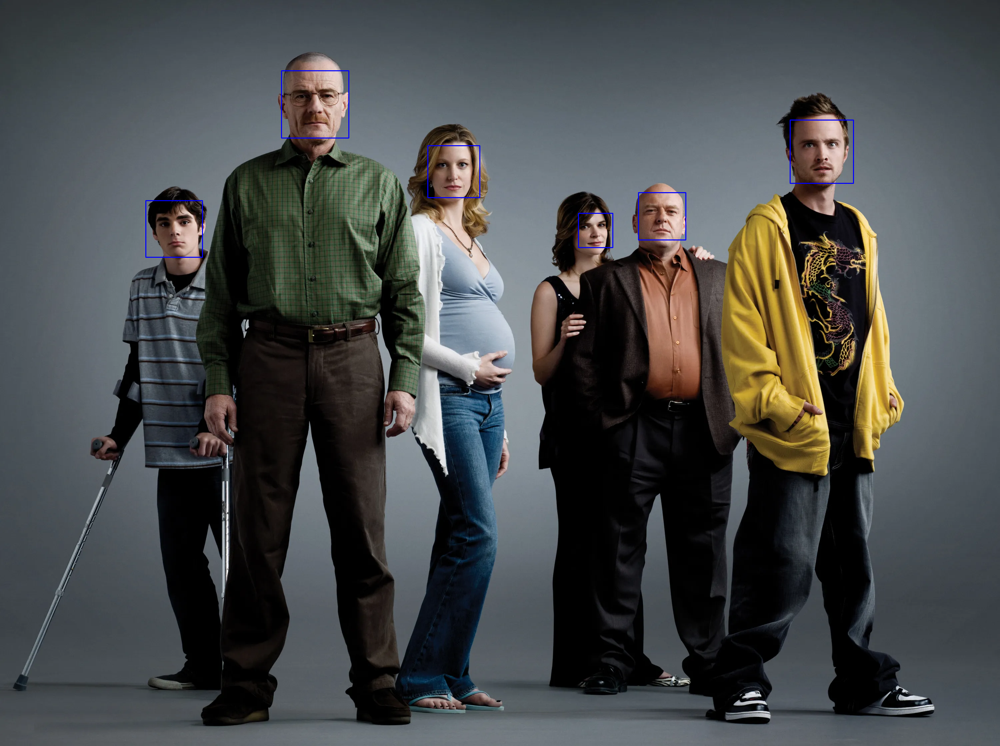

In [ ]:
faceDetect(picPath)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [29]:
# Make sure that for this activity, you have downloaded the
# file indicated below from the resource linked in the instructional materials
# in the module.

import cv2
from google.colab.patches import cv2_imshow


picPath = '/content/drive/MyDrive/EMTECH1/faces.png'
haarPath = '/content/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)

  cv2_imshow(img)

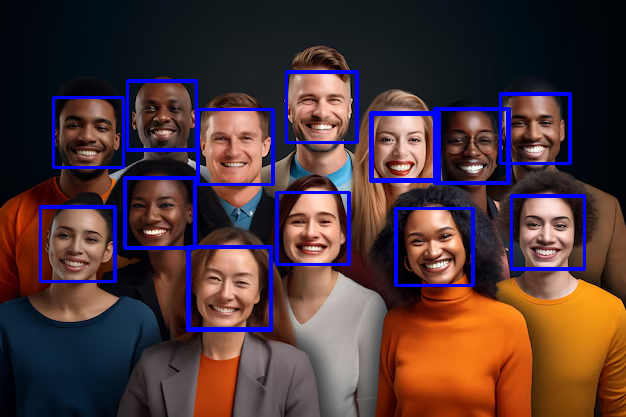

In [30]:
faceDetect(picPath)

**Analysis**:
- Based on your earlier analysis, where do you think the face detection works in the line of code above?
- Provide an analysis of the parameters of the `detectMultiScale` method.
- Change the color of the border of the detected faces to red.
- Are you able to make the borders thicker? Demonstrate.

 Based on your earlier analysis, where do you think the face detection works in the line of code above?
- Face detection happens when the image frame is passed into the detection function (like detectMultiScale in OpenCV), which scans for facial patterns and outputs the coordinates of any faces found.



 Provide an analysis of the parameters of the `detectMultiScale` method.
- The detectMultiScale method is a key function in OpenCV for detecting objects, such as faces, in an image, even when they appear in various sizes. It operates by scanning the input image multiple times at different scales (scaleFactor) and positions.

Change the color of the border of the detected faces to red.


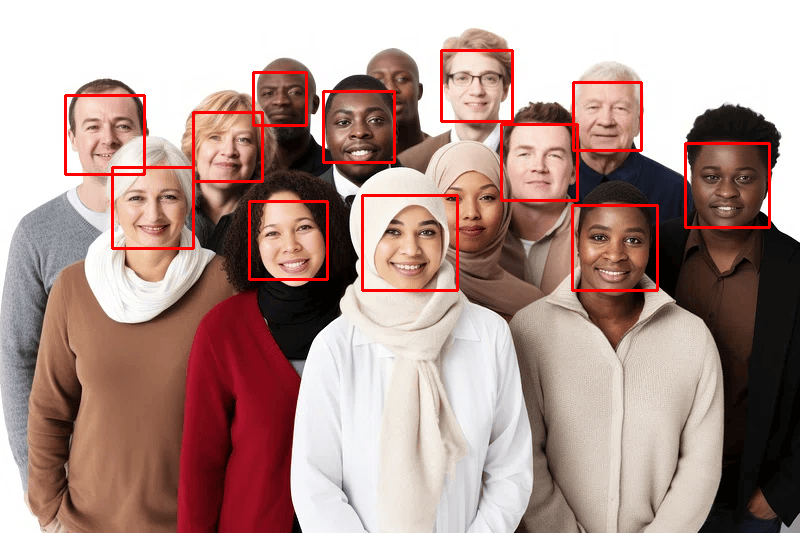

In [32]:
import cv2
from google.colab.patches import cv2_imshow

picPath = '/content/drive/MyDrive/EMTECH1/people.png'
haarPath = '/content/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    # Change border color to red (BGR: 0,0,255)
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (0,0,255), 2)

  cv2_imshow(img)


faceDetect(picPath)


- Are you able to make the borders thicker? Demonstrate.

YES. I was able to make the borders thicker.

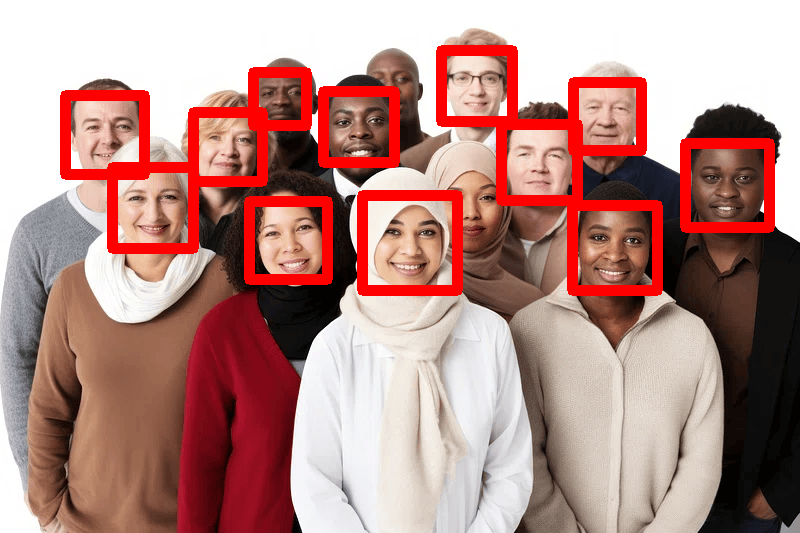

In [34]:
import cv2
from google.colab.patches import cv2_imshow

picPath = '/content/drive/MyDrive/EMTECH1/people.png'
haarPath = '/content/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    # Change border color to red (BGR: 0,0,255)
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (0,0,255), 10)

  cv2_imshow(img)

faceDetect(picPath)


### Performing face detection on video

**Step 1**: Create a file called face_detection.py and include the following


codes.

In [35]:
import cv2

**Step 2:** After this, we declare a method, `detect()`, which will perform face detection.

In [46]:
def detect():
  face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
  eye_cascade = cv2.CascadeClassifier('/content/haarcascade_eye.xml')
  camera = cv2.VideoCapture(0)

**Step 3:** The first thing we need to do inside the detect() method is to load the Haar cascade files so that OpenCV can operate face detection. As we copied
the cascade files in the local `cascades/` folder, we can use a relative path. Then, we open a VideoCapture object (the camera feed). The VideoCapture  constructor takes a parameter, which indicates the camera to be used; zero indicates the first camera available.

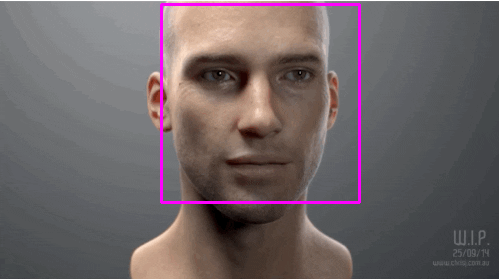

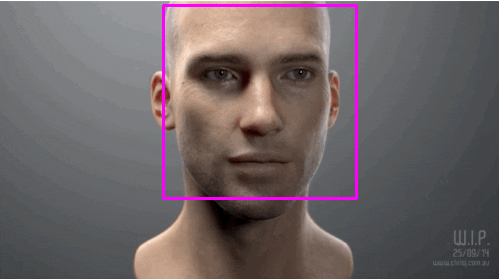

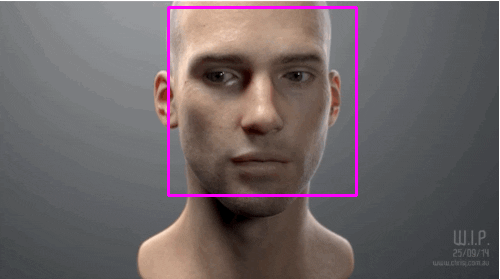

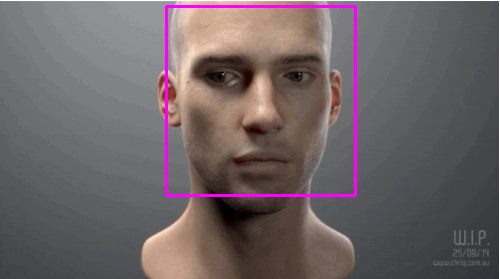

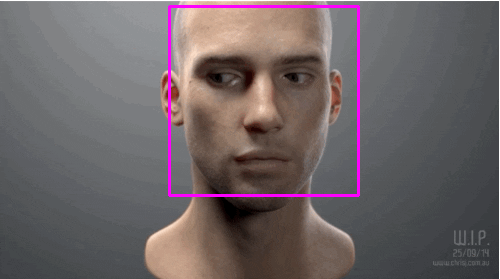

...

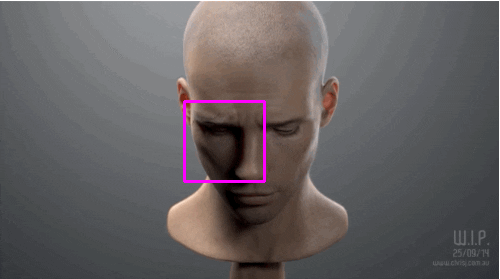

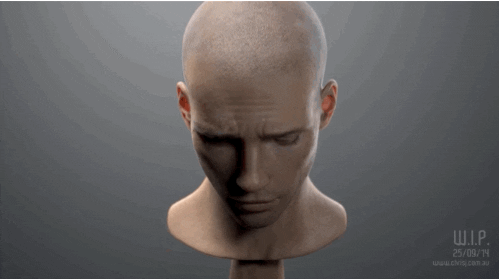

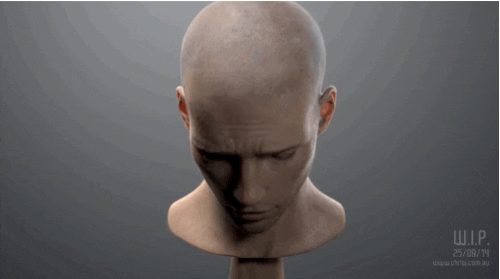

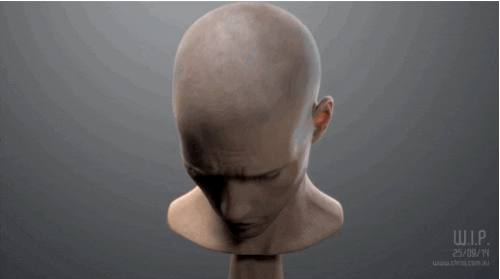

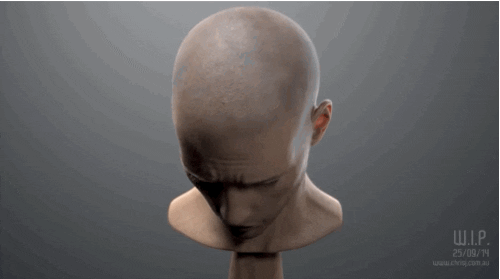

In [67]:
import cv2
from google.colab.patches import cv2_imshow
import time

def detect():
    face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('/content/haarcascade_eye.xml')

    if face_cascade.empty():
        print("Error: Could not load face cascade XML file.")
        return
    if eye_cascade.empty():
        print("Error: Could not load eye cascade XML file.")
        return

    gif_path = "/content/drive/MyDrive/EMTECH1/giphy.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    frame_count = 0
    while True:
        ret, frame = camera.read()
        if not ret:
            print("End of video or failed to read frame.")
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)

        if len(faces) > 0:
            (x, y, w, h) = faces[0]
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)

        cv2_imshow(frame)
        frame_count += 1

        time.sleep(0.2)

        if frame_count > 20:
            break

    camera.release()

detect()

**Step 4:** Next up, we capture a frame. The read() method returns two values: a Boolean indicating the success of the frame read operation, and the frame
itself. We capture the frame, and then we convert it to grayscale. This is a necessary operation, because face detection in OpenCV happens in the grayscale color space:

Original Frame:


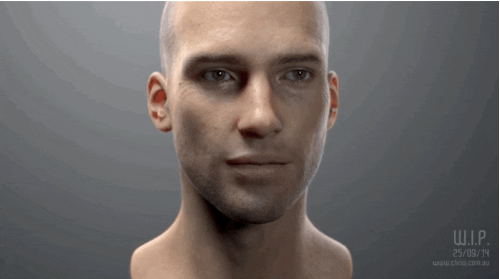

Grayscale Frame:


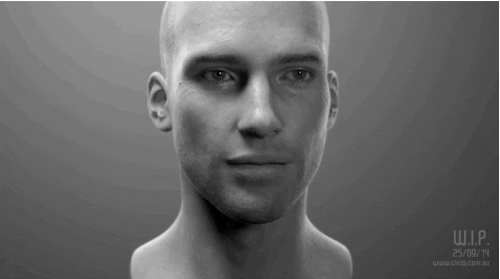

In [78]:
import cv2
from google.colab.patches import cv2_imshow

def detect():
    gif_path = "/content/drive/MyDrive/EMTECH1/giphy.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    ret, frame = camera.read()
    if not ret:
        print("Failed to read frame.")
        return

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    print("Original Frame:")
    cv2_imshow(frame)
    print("Grayscale Frame:")
    cv2_imshow(gray)


if __name__ == "__main__":
    detect()


**Step 5:** Much like the single still image example, we call detectMultiScale on the grayscale version of the frame.

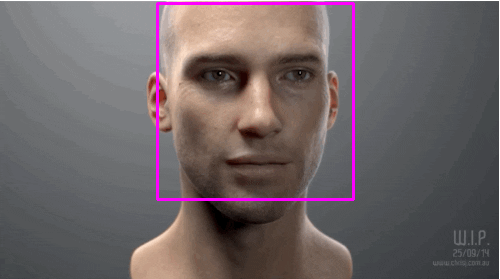

In [85]:
import cv2
from google.colab.patches import cv2_imshow

def detect():
    gif_path = "/content/drive/MyDrive/EMTECH1/giphy.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')

    if face_cascade.empty():
        print("Error: Could not load face cascade XML file. Please ensure 'haarcascade_frontalface_default.xml' is in /content/")
        return

    while True:
        # Step 4: Capture a frame
        ret, frame = camera.read()
        if not ret:
            print("End of video or failed to read frame.")
            break

        # Convert to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Step 5: Detect faces in the grayscale frame
        faces = face_cascade.detectMultiScale(
            gray,
            scaleFactor=1.3,
            minNeighbors=5
        )

        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)

        cv2_imshow(frame)


        break

    camera.release()

detect()

**Step 6:** Here we have a further step compared to the still image example: we create a region of interest corresponding to the face rectangle, and within this rectangle, we operate "eye detection". This makes sense as you wouldn't want to go looking for eyes outside a face (well, for human beings at least!).

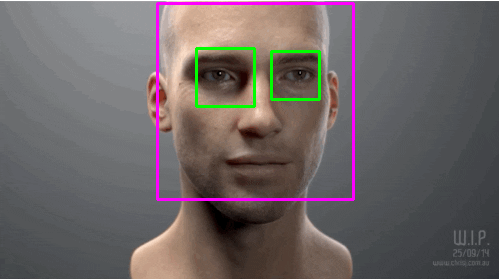

In [87]:
import cv2
from google.colab.patches import cv2_imshow

def detect():
    face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('/content/haarcascade_eye.xml')

    if face_cascade.empty():
        print("Error: Could not load face cascade XML file. Please ensure 'haarcascade_frontalface_default.xml' is in /content/")
        return
    if eye_cascade.empty():
        print("Error: Could not load eye cascade XML file. Please ensure 'haarcascade_eye.xml' is in /content/")
        return

    gif_path = "/content/drive/MyDrive/EMTECH1/giphy.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    while True:
        ret, frame = camera.read()
        if not ret:
            print("End of video or failed to read frame.")
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

        for (x, y, w, h) in faces:
            # Draw rectangle around face
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)

            roi_gray = gray[y:y+h, x:x+w]
            roi_color = frame[y:y+h, x:x+w]

            eyes = eye_cascade.detectMultiScale(
                roi_gray,
                scaleFactor=1.03,
                minNeighbors=5,
                minSize=(40, 40)
            )

            for (ex, ey, ew, eh) in eyes:
                cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

        cv2_imshow(frame)


        break

    camera.release()

if __name__ == "__main__":
    detect()

**Step 7:** Again, we loop through the resulting eye tuples and draw green rectangles around them.

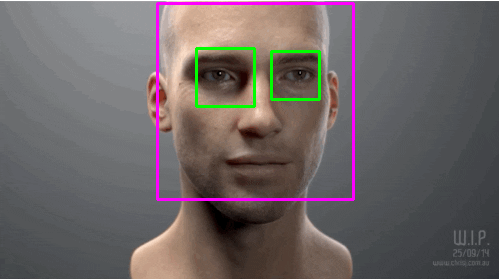

In [89]:
import cv2
from google.colab.patches import cv2_imshow

def detect():
    face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('/content/haarcascade_eye.xml')

    if face_cascade.empty():
        print("Error: Could not load face cascade XML file. Please ensure 'haarcascade_frontalface_default.xml' is in /content/")
        return
    if eye_cascade.empty():
        print("Error: Could not load eye cascade XML file. Please ensure 'haarcascade_eye.xml' is in /content/")
        return

    gif_path = "/content/drive/MyDrive/EMTECH1/giphy.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    while True:
        ret, frame = camera.read()
        if not ret:
            print("End of video or failed to read frame.")
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)

            roi_gray = gray[y:y+h, x:x+w]
            roi_color = frame[y:y+h, x:x+w]

            eyes = eye_cascade.detectMultiScale(
                roi_gray,
                scaleFactor=1.03,
                minNeighbors=5,
                minSize=(40, 40)
            )

            for (ex, ey, ew, eh) in eyes:
                cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

        cv2_imshow(frame)


        break

    camera.release()

if __name__ == "__main__":
    detect()

**Provide the following**:
- Screenshot of the output for the working code once you've put it all together.
- Summary of the steps you've performed along with observations.

## 4. Supplementary Activity

In your Cameo project, include real-time face detection using Haar cascade. Show screenshots of the working demonstration for this supplementary activity.

Additionally, implement similar steps to detect a smile using Haar cascades.

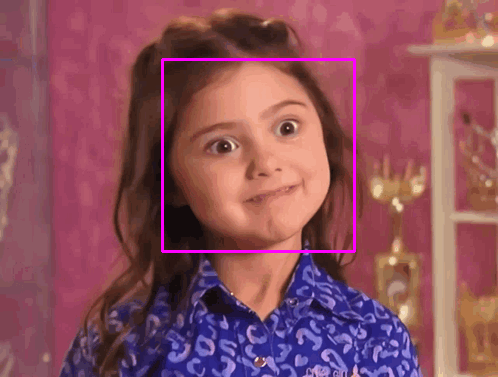

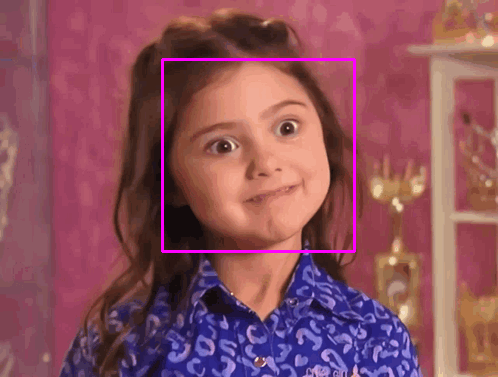

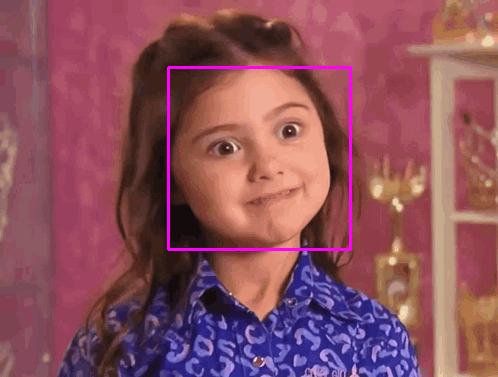

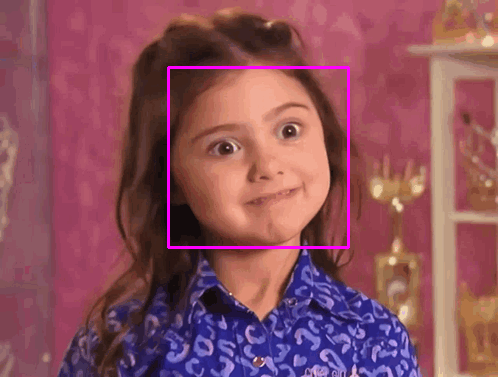

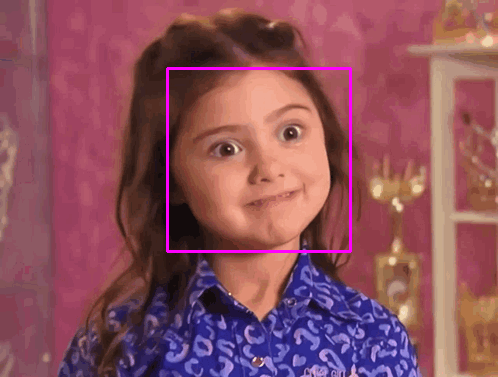

...

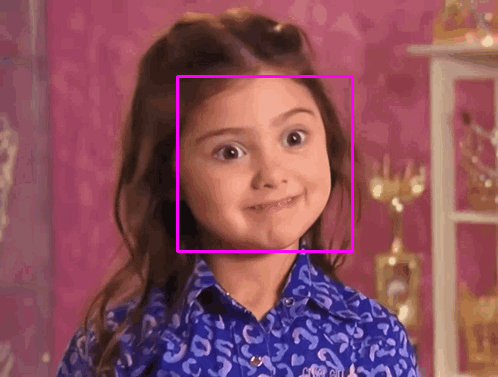

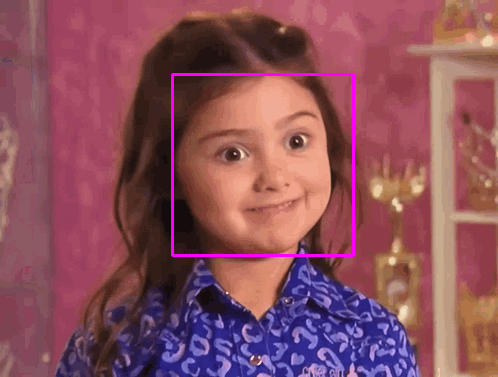

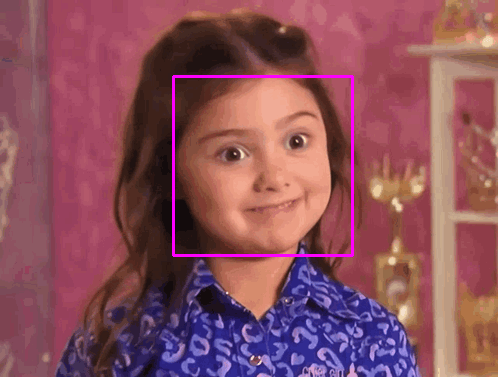

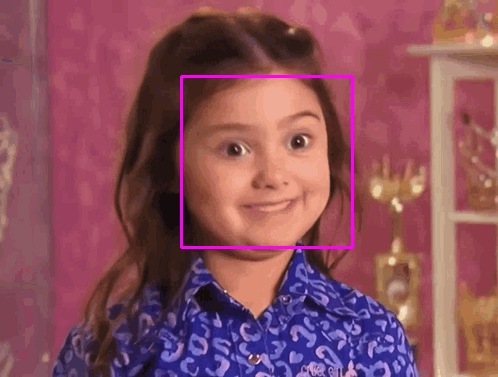

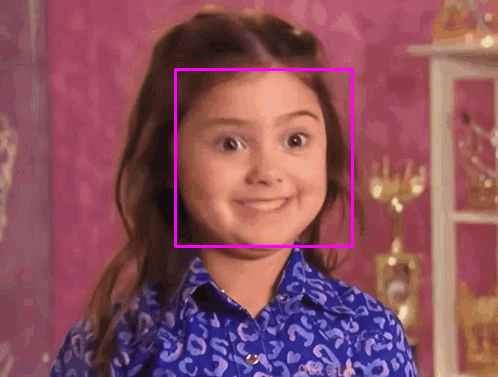

In [95]:
import cv2
from google.colab.patches import cv2_imshow

def detect():
    face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
    smile_cascade = cv2.CascadeClassifier('/content/haarcascade_smile.xml')

    if face_cascade.empty():
        print("Error: Could not load face cascade XML file. Please ensure 'haarcascade_frontalface_default.xml' is in /content/")
        return
    if smile_cascade.empty():
        print("Warning: Could not load smile cascade XML file. Smile detection will not work. Please ensure 'haarcascade_smile.xml' is in /content/")

    gif_path = "/content/drive/MyDrive/EMTECH1/toddlersmile.gif"
    camera = cv2.VideoCapture(gif_path)

    if not camera.isOpened():
        print(f"Error: Could not open video source at {gif_path}")
        return

    frame_count = 0
    while True:
        ret, frame = camera.read()
        if not ret:
            print("End of video or failed to read frame.")
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)

            roi_gray = gray[y:y+h, x:x+w]
            roi_color = frame[y:y+h, x:x+w]

            if not smile_cascade.empty():
                smiles = smile_cascade.detectMultiScale(
                    roi_gray,
                    scaleFactor=1.7,
                    minNeighbors=22,
                    minSize=(25, 25)
                )
                for (sx, sy, sw, sh) in smiles:
                    cv2.rectangle(roi_color, (sx, sy), (sx+sw, sy+sh), (0, 255, 255), 2)

        cv2_imshow(frame)
        frame_count += 1

        if frame_count > 10:
            break

    camera.release()

detect()

## 5. Summary, Conclusions and Lessons Learned

- For this hands-on activity (face detection using OPENCV) allows the student to understand how face detection works and how we program detection or (face) recognition. Face detection using OpenCV shows how powerful computer vision can be when applied to everyday tasks. By loading Haar cascade files, we can train the program to recognize human features such as faces, eyes, and even smiles. The process works by converting images or video frames into grayscale, then scanning them for patterns that match the Haar-like features stored in the cascade files. Once detected, rectangles are drawn around the features, making it easy to visualize the results. During this activity, it enhance our capabilities to learn about coding, to understand the concept of detection, and to able to comprehend the topic of face detection using opencv.

<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*